# EPSRC: AI Skills Through Music 🤖🎹

© 2025, [Dr. Huw Cheston](https://huwcheston.github.io), Queen Mary University of London

## Useful Links

- Documentation for the [`numpy` Python package](https://numpy.org/doc/)
- Documentation for [`librosa`](https://librosa.org/)
- An introduction to [**convolutional neural networks**](https://www.ibm.com/think/topics/convolutional-neural-networks)
- Approaches to [tackling domain shift in computer vision](https://medium.com/@bensalemh300/tackling-domain-shift-in-ai-a-deep-dive-into-domain-adaptation-c2debd758edd)

# 4. Domain Shift and Adaptation 🤖▶🌏

In the **previous notebook**, we explored how to evaluate and interpret a machine learning model. We learned that, even when a model **sems to perform well**, it can **still make mistakes** if we're not careful with how **we test it.** But there's another challenge that can cause a machine learning model to fail in a surprising way: **domain shift**.

**Domain shift** happens when a model is trained on one kind of data but is later tested or used on data that **looks different**. Even small changes - like lighting in a photo, wording in a sentence, or background noise in an audio clip - can confuse a model that wasn't prepared for them. As a result, a model that once seemed accurate **might suddenly struggle.**

In this notebook, we'll explore:
- What domain shift is
- A real-world example where domain shift occurs
- How domain shift might lead to **bias** in a machine learning model
- Strategies for mitigating domain shift

These ideas will help us understand **when and why models fail**, and what we can do to help them adapt to new or changing situations.


In [137]:
# @title
import IPython.display as ipd
import numpy as np
import librosa
import torch
import torch.nn.functional as F
import os
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from copy import deepcopy
from tqdm import tqdm
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from pathlib import Path

## What is Domain Shift? 🔢

Imagine you're training model to recognise the **number from an image**. You source a diverse dataset of number from a variety of places, including house numbers and street signs. When you come to evaluate your model on the same types of images, your model seems to be performing well.

Your friend then asks to use your model on a dataset they've gathered, containing **numbers written by hand**. To your surprise, you find that your model struggles to make correct predictions on this new data. This phenomenon is called **domain shift**.

#### Source and Target Domain 🌐

When we describe **domain shift**, we usually use the terms **source** and **target domain**. Our **source domain** consists of the data **we train the model on**. The **target domain** is the data the model sees when it's **tested in the real world**. In our above example, the **source domain** is numbers from photos, while the **target domain** is numbers written by hand.

If the target domain looks different from the source domain, the model may struggle, because it won't have learned how to **generalise** properly to the new data.

<img src="https://miro.medium.com/v2/resize:fit:1400/format:webp/1*JvGDKGD3bl-Tpdx82YEjzg.png" width="600px"/>



#### Why Does Domain Shift Matter? 🤔

Domain shift can lead to several key problems in a machine learning model:

1. **Poor performance**: a model that struggles with data from the target domain may make **far more mistakes** in its predictions.
2. **Lack of reliability**: a model that works well in one enviornment may become unreliable when deployed in another, making it difficult to **trust the model**
3. **Increased bias**: if the training data represents only certain groups or cultures - such as *mostly Western examples* - the model may perform worse on underrepresented groups, leading to **unfair or uneven outcomes.**
4. **Increased costs**: Fixing a model that struggles with domain shift **can be costly:** it may require collecting new data, redesigning the architecture, or even retraining the model from scratch.

#### Tackling Domain Shift 💪

When we try and address domain shift in our model, we usually use techniques that fall under the umbrella term of **domain adaptation**. There are many different techniques that can be used for domain adaptation. The right one will often depend on the **data we have available**: for instance, whether or not we have **labels** from both the source and target domain.

<img src="https://www.researchgate.net/profile/Chunmei-He-2/publication/360746695/figure/fig1/AS:11431281112623202@1673492253875/Illustration-of-domain-adaptation-Blue-and-green-graphics-respectively-represent-the.png" width="600px"/>



## A Real-World Example: Tempo Estimation 🥁

Now that we know the **theory** behind domain shift, let's take a look at an example where this occurs in real life. In the previous notebook, we explored the concept of music **beat tracking**. This involves detecting the **pulse** of a recording: finding the points in which you'd tap your foot or nod your head to.

A related concept is **tempo estimation**: calculating the musical pace across *all beats*. Typically, the tempo of a piece of music is expressed in the number of **beats per minute**. Increasing the number of **beats per minute** means a faster musical pace.

Try listening to these two recordings. Which one has the faster tempo?

> **Hint**: which recording makes you tap your foot quicker than the other?

In [2]:
ipd.HTML('''
<iframe width="560" height="315"
src="https://www.youtube.com/embed/8wGJpbPKbz8"
referrerpolicy="strict-origin-when-cross-origin"
</iframe>
''')

In [3]:
ipd.HTML('''
<iframe width="560" height="315"
src="https://www.youtube.com/embed/sZMwA1zXM2k"
referrerpolicy="strict-origin-when-cross-origin"
</iframe>
''')

The correct answer is the **first video**. This famous performance of *Koko* by jazz musician Charlie Parker reaches a speed of **over 300 beats per minute**. That's five beats per second!

> **Did you know?**: Accurate tempo estimation is very important to DJs and electronic music producers, who rely on the results of these models in order to **mix** and **mashup** different recordings together.


### Introducing GTZAN 📢

In this notebook, we're going to use the **GTZAN** dataset. This is one of the most widely used datasets in machine listening research. It consists of 1000 30 second audio recordings from 10 genres (100 audio files each). Alongside these genre annotations, we also have **beat** and **tempo** annotations, which we can use as the ground truth to train our model.

Unlike the **TinySOL** dataset used in the previous notebooks, **GTZAN** is *not available* as part of the `mirdata` Python library. Instead, we need to download both the audio files and annotations separately:

> **Hint:** if you're not familiar with **TinySOL** or `mirdata`, check out the previous notebooks.

In [4]:
!rm -rf dataset-gtzan
!git clone https://github.com/audiocontentanalysis/dataset-gtzan.git

Cloning into 'dataset-gtzan'...
remote: Enumerating objects: 1011, done.
remote: Total 1011 (delta 0), reused 0 (delta 0), pack-reused 1011 (from 1)
Receiving objects: 100% (1011/1011), 1.12 GiB | 36.23 MiB/s, done.
Resolving deltas: 100% (6/6), done.
Updating files: 100% (1012/1012), done.


In [5]:
!rm -rf dataset_tempo_beat
!git clone https://github.com/TempoBeatDownbeat/gtzan_tempo_beat.git

Cloning into 'gtzan_tempo_beat'...
remote: Enumerating objects: 1936, done.
remote: Counting objects: 100% (1936/1936), done.
remote: Compressing objects: 100% (994/994), done.
remote: Total 1936 (delta 0), reused 1933 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (1936/1936), 309.52 KiB | 7.55 MiB/s, done.


> **Good to know:** The **GTZAN** dataset was created by (and named after) computer science research [*Professor George Tzanetakis*](https://webhome.csc.uvic.ca/~gtzan/index.html), a highly influential figure in apply **machine learning to music**, who is also an expert saxophone player:

<img src="https://miro.medium.com/v2/resize:fit:800/1*cbnrkP7atuBifQ3g8ebpsg.jpeg" width="300px"/>




#### Loading Data 💽

Let's load up our data first. We need to get the following information:
1. The path to each audio file,
2. The associated **tempo** (in number of **beats-per-minute**)
3. The track **genre**

> **Tip:** Normally we'd use `mirdata` to help us out here. As **GTZAN** is not available as part of this library, however, we'll have to write the loading code ourselves.

In [6]:
audio_root = Path("dataset-gtzan/genres")
tempo_root = Path("gtzan_tempo_beat/tempo")

assert audio_root.exists(), "Can't find audio files: have you run the previous cells?"
assert tempo_root.exists(), "Can't find tempo files: have you run the previous cells?"

parsed_data = []

for audio in audio_root.rglob("**/*.wav"):
    # Parse the filename to get the tempo path
    tempo_fpath = tempo_root / ("gtzan_" + str(audio.name).replace(".", "_").replace("_wav", ".bpm"))
    # Not all tracks have tempo annotations
    if not tempo_fpath.exists():
        continue

    # Open the .bpm file to get the tempo, rounded to the nearest integer
    with open(tempo_fpath, "r") as tfp:
        tempo = float(tfp.read())

    # We can parse the genre from the filename
    genre = str(audio.parent.name)

    # Append the data as follows: filename, tempo, genre
    parsed_data.append((str(audio), tempo, genre))

track_df = pd.DataFrame(parsed_data, columns=["file", "tempo", "genre"])
print(f"Loaded {len(track_df)} tracks from GTZAN with annotations!")

Loaded 999 tracks from GTZAN with annotations!


### Visualising Genres 🖌

Let's take a look at the genres that we have in **GTZAN**:

In [7]:
gtzan_genres = track_df["genre"].unique()
print(f"GTZAN genres: {gtzan_genres}")

GTZAN genres: ['pop' 'disco' 'jazz' 'classical' 'blues' 'rock' 'country' 'metal'
 'reggae' 'hiphop']


What do you notice about the genres contained in **GTZAN**?

> **Tip:** try thinking about **the countries where these musical genres may have originated**. How might this introduce **domain shift**?

#### Creating Data Splits 🗒

Let's split our data up.

In order to demonstrate **domain shift**, we're going to create **three different splits**:

1. **Training split**: contains 90% of recordings from 9/10 genres in GTZAN (i.e., 800/1000 tracks)
2. **Validation split**: contains 10% of recordings from 9/10 genres in GTZAN (i.e., 100/1000 tracks)
3. **Testing split**: contains **all recordings** from 1/10 genre in GTZAN (i.e., 100/1000 tracks)

The purpose here is to see how well our model **generalises** to the unseen genre.

> **Try it out**: once you've run these cells once, try changing the value of `left_out_genre` to experiment with leaving different genres out of the training process.

In [8]:
left_out_genre = "classical"

In [9]:
target_tracks = track_df[track_df["genre"] == left_out_genre]
source_tracks = track_df[track_df["genre"] != left_out_genre]

In [10]:
# Create training and validation splits first
X, y, z = zip(*source_tracks.values)
train_X, val_X, train_y, val_y = train_test_split(
    X, y,
    test_size=0.11,
    random_state=42,
    stratify=z
)

# Then, create test splits simply from the dataframe
test_X, test_y = target_tracks["file"].to_list(), target_tracks["tempo"].to_list()

# Also store genres
train_z = [fp.split(os.path.sep)[-2] for fp in train_X]
val_z = [fp.split(os.path.sep)[-2] for fp in val_X]
test_z = [fp.split(os.path.sep)[-2] for fp in test_X]

print(f"Training set: {len(train_y)} tracks, {len(np.unique(train_z))} genres")
print(f"Training set: {len(val_y)} tracks, {len(np.unique(val_z))} genres")
print(f"Testing set: {len(test_y)} tracks, {len(np.unique(test_z))} genres")

Training set: 800 tracks, 9 genres
Training set: 99 tracks, 9 genres
Testing set: 100 tracks, 1 genres


### Understanding Tempo in GTZAN 💿

As we did in the previous notebooks, let's take a step back to look and explore our dataset, before we get to modelling.

#### Visualise Tempo Distributions 📊

Let's first explore the **distribution** of tempo classes in each of our data splits.

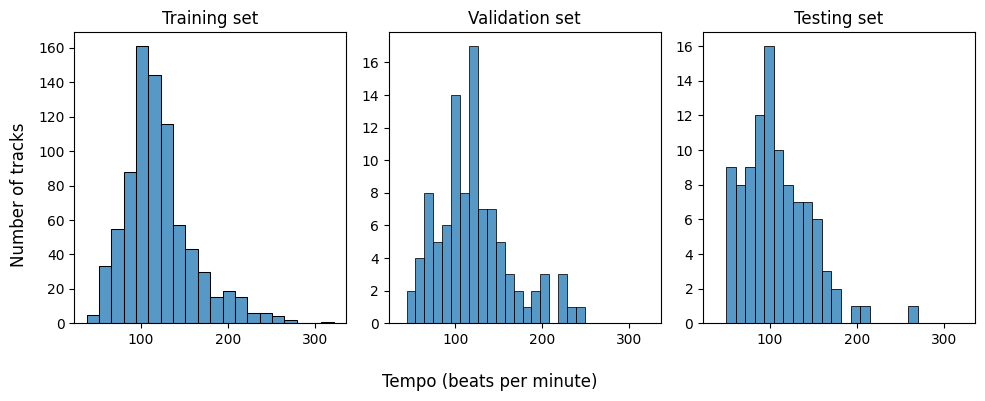

In [11]:
fig, ax = plt.subplots(1, 3, figsize=(10, 4), sharex=True, sharey=False)
sns.histplot(train_y, ax=ax[0], bins=20)
sns.histplot(val_y, ax=ax[1], bins=20)
sns.histplot(test_y, ax=ax[2], bins=20)

ax[0].set(title="Training set", xlabel="", ylabel="")
ax[1].set(title="Validation set", xlabel="", ylabel="")
ax[2].set(title="Testing set", xlabel="", ylabel="")
fig.supxlabel("Tempo (beats per minute)")
fig.supylabel("Number of tracks")

plt.tight_layout()
plt.show()

What do you notice about the distribution of tempo values across different splits and musical genres?

> **Think about**: how might this affect the performance of a model?

#### Defining Tempo Classes 🎵

Our model will be a classifier, which will try and predict the BPM from an input audio file. However, rather than trying to predict the **exact BPM**, we'll instead **round this to the nearest 10 BPM** (i.e., for a value of 78 BPM, we'll try and predict 80 BPM).

> **Good to know**: we can refer to this process as **binning**: think of it as similar to the bins we create when we plot a histogram.

In [12]:
def base_round(n: float, base: int = 10) -> int:
    """
    Rounds a value to the nearest base
    """
    rem = n % base
    if rem < 5:
        n_ = int(n / base) * base
    else:
        n_ = int((n + base) / base) * base
    return int(n_)

In [13]:
min_tempo = base_round(min(track_df["tempo"]))
max_tempo = base_round(max(track_df["tempo"]))
tempo_range = np.array(range(min_tempo, max_tempo + 1, 10))
n_tempo_classes = len(tempo_range)
print(f"Tempo classes: {tempo_range}")

Tempo classes: [ 40  50  60  70  80  90 100 110 120 130 140 150 160 170 180 190 200 210
 220 230 240 250 260 270 280 290 300 310 320]


#### Visualise Tempo Classes 🖌

Let's plot the number of recordings within each of our tempo bins:

/tmp/ipython-input-2631879572.py:9: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plt.gca().set_xticklabels(plt.gca().get_xticklabels(), rotation=90)


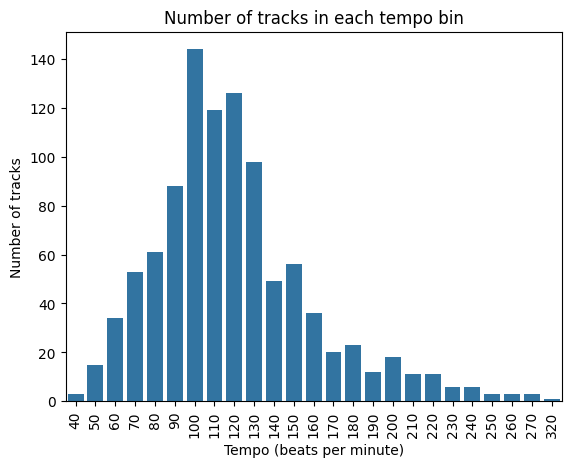

In [14]:
# Group by tempo bin and calculate the number of recordings in each bin
track_df["tempo_bin"] = track_df["tempo"].apply(base_round)
grped = track_df.groupby("tempo_bin").count()["file"].reset_index()

# Create the barplot
sns.barplot(grped, x="tempo_bin", y="file")

# Plot aesthetics
plt.gca().set_xticklabels(plt.gca().get_xticklabels(), rotation=90)
plt.xlabel("Tempo (beats per minute)")
plt.ylabel("Number of tracks")
plt.title("Number of tracks in each tempo bin")
plt.show()

Great: we can see that **the vast majority of recordings in GTZAN** have a tempo between 80 and 150 beats-per-minute. This is a common tempo in Western pop and rock music. In contrast, slower recordings (less than 50 BPM) and faster recordings (greater than 200 BPM) are represented much less.

### Constructing our Model 🤖

Let's start **constructing our tempo estimation model**, which will be a **convolutional neural network**.

> **Important**: the content in this section assumes you have read and understood the section on neural networks in the **Learning Paradigms** notebook, and the section on audio spectrograms in the **Data Representations** notebook.

#### Introducing Convolutional Neural Networks 🧠

Convolutional networks are a type of neural network that uses a combination of **convolutional**, **activation**, **normalisation**, and **pooling** layers to **learn features** directly from an input, before passing these features to a **fully-connected layer** in order to predict the target tempo.



**Convolution layers** scan over the spectrogram to pick out useful features. They use a filter (or kernel) that slides over the input data, performing element-wise multiplications and summing the results to produce a feature map. This process allows the network to detect patterns such as edges, textures and shapes in the input images.

When defining a convolution layer, we have to think about the following parameters:

1. **Filter size**: the size of the matrix used to extract features from the input. For instance, a matrix with **many columns** might detect horizontal edges better than one with **many rows**.
2. **Stride**: the step size with which the filter **slides across the input data**
3. **Padding**: the values added around the input to control the dimensionality.

The animation below shows the convolution process.

<details>
<summary><em>Question</em>: what is the filter size and stride shown in this graph?</summary>
<strong>Filter size:</strong> 3x3
<strong>Stride:</strong> 1x1
</details>

<img src="https://miro.medium.com/1*Fw-ehcNBR9byHtho-Rxbtw.gif" width="600px"/>




**Activation layers** introduce **non-linear transformations** to the features extracted by a linear layer. This can help the model to learn **more complex features**.

> **Tip**: a simple and common form of non-linearity is the *rectified linear unit* (ReLU). This function simply sets negative values to 0, and keeps positive values, as in $f(x) = \text{max}(0, x)$. We'll use ReLU in our model.

They can also help address the following issues:
- **Vanishing gradients**: where the parameter updates to the model become so small, as if to stop the model from learning
- **Exploding gradients**: where the parameter updates become exponentially large, causing numerical instability

**Normalisation layers** keep the data within a stable range, which can improve performance and reduce the time required to train a model. There are many different types of normalisation that can be applied to an input. Two of the most common are:

1. **Batch normalisation:** normalises values for a single feature across all items in a batch.
2. **Layer normalisation:** normalises all features within a single item, rather than across the batch.

For a simple explanation of the differences, see the image below:

<img src="https://i.sstatic.net/6CbH3.png" width="600px"/>


**Pooling layers** reduce the size of the input by only keeping the **most important features**. Like convolution layers, pooling layers also rely on a kernel which sweeps over the input. Two common types of pooling are:

1. **Max pooling**: which keeps the **maximum value** within the range covered by the kernel
2. **Average pooling**: which keeps the **average value** within the kernel

The image below shows the differences intuitively between these two types of pooling

<img src="https://wiki.cloudfactory.com/media/pages/docs/mp-wiki/key-principles-of-computer-vision/pooling/65164fd82f-1688638156/max-pooling-vs-average-pooling.webp" width="600px"/>



#### Creating the Model in `pytorch` 🔥

Our model architecture is inspired by [this paper](https://arxiv.org/pdf/1903.10839). We use the following process:

1. Load audio as a **spectrogram** with 40 bands, 250 frames, and one channel (i.e., $40 \times 256 \times 1$)
2. Process audio using three blocks. The first two blocks contain convolution, activation, and normalisation layers, while the third block contains only convolution and activation layers. In between blocks 2 and 3 is a pooling layer.
3. Flattens the extracted features to a single vector with shape `n_tempo_classes`
4. Feeds the features to a vector that predicts the tempo class.
5. Use the **cross entropy** loss to compute the minimize the probability of predicting the **incorrect tempo**.

Let's define the model in `pytorch`.

> **Tip**: if you want a refresher on how to use `pytorch`, check out the notebook on **Learning Paradigms**.

In [84]:
class TempoEstimatorCNN(torch.nn.Module):
    """
    A tempo estimator model using a CNN, inspired by [1]

    The model takes in an audio spectrogram and outputs the probability of it
    being from each tempo class.

    Parameters:
        num_classes: number of output classes
        k: exponent for filter count (filters = 2^k)

    References:
        [1]: Schreiber, Hendrik and Meinard, Muller (2018). A Single-Step
             Approach to Musical Tempo Estimation Using a Convolutional Neural
             Network. In Proceedings of the 19th International Society for Music
             Information Retrieval Conference (ISMIR), pp. 98-105.
    """

    def __init__(
            self,
            num_classes: int,
            k: int = 6,
        ):
        super().__init__()
        filters = 2 ** k  # number of channels used throughout

        # Block 1: Conv(1×5) → ReLU → BatchNorm
        self.block1 = torch.nn.Sequential(
            torch.nn.Conv2d(
                1,
                filters,
                kernel_size=(1, 5),
                padding='same'
            ),
            torch.nn.ReLU(),
            torch.nn.BatchNorm2d(filters)
        )
        # Block 2: Conv(1×3) → ReLU → BatchNorm
        self.block2 = torch.nn.Sequential(
            torch.nn.Conv2d(
                filters,
                filters,
                kernel_size=(1, 3),
                padding='same'
            ),
            torch.nn.ReLU(),
            torch.nn.BatchNorm2d(filters)
        )
        # Pool + Dropout
        self.pool1 = torch.nn.Sequential(
            torch.nn.MaxPool2d((1, 2)),
            torch.nn.Dropout(0.3)
        )
        # Block 3: Conv(1×1) → ReLU
        self.block3 = torch.nn.Sequential(
            torch.nn.Conv2d(
                filters,
                filters,
                kernel_size=(1, 1)
            ),
            torch.nn.ReLU()
        )
        # Global average pool
        self.pool2 = torch.nn.AdaptiveAvgPool2d((1, 1))
        # Final classification layer
        self.fc = torch.nn.Linear(filters, num_classes)

    def forward_features(self, x: torch.Tensor) -> torch.Tensor:
        """
        Compute the features of the input spectrogram.

        Hint: sometimes it is useful to split out feature extraction
        and classification into separate functions. This can be useful
        later if, for instance, you want to use the features extracted
        by the model for another task, with a different classification
        head.
        """
        # Reshape to (batch, channels, height, width)
        x = x.permute(0, 3, 1, 2)

        # Run through all layers
        x = self.block1(x)
        x = self.block2(x)
        x = self.pool1(x)
        x = self.block3(x)
        x = self.pool2(x)

        # Return flattened feature vector: shape (batch, features)
        return torch.flatten(x, 1)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # Extract features from the input
        # shape (batch, features)
        x = self.forward_features(x)

        # Compute output logits
        # shape (batch, n_classes)
        return self.fc(x)

#### Initialising the Model 🤖

Now, we can initialise the model, using the number of tempo classes defined in the cell above.

> **Tip:** once you've trained the model once, try setting the value of $k$ to control the kernel sizes of the convolutional filters. What effect does this have on the performance of the model?

In [85]:
model = TempoEstimatorCNN(n_tempo_classes, k=6)
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

n_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Number of parameters: {n_params}")

Number of parameters: 19037


### Loading the Data 🚚

Now, we can define our dataset, which will prepare our spectrograms and labels in order to pass to our model. We need to do the following:

1. Load the audio signal using `librosa`
2. Chunk the audio signal into frames
3. Convert every frame to a spectrogram
4. **Normalize** the spectrogram
5. Compute the nearest 10 BPM from the labelled tempo
6. Return the spectrogram, tempo value, and genre for a single frame


In [106]:
class AudioLoader(torch.utils.data.Dataset):
    """
    Torch dataset for working with audio frames.

    Takes in a list of Track objects, then extracts frames for all track audio
    files.

    Parameters:
        tracks: a list of track filepaths
        tempos: a list of tempo values
        genres: a list of genres
        hop_length: hop length for the mel spectrogram
        n_frames: number of frames in each spectrogram
        target_sr: target sample rate
        offset: only consider audio from this point onwards
    """

    def __init__(
        self,
        tracks: list,
        tempos: list,
        genres: list,
        offset: float = 0.,
        hop_length: str = 128,
        n_frames: int = 256,
        target_sr: int = 11025,
    ):
        super().__init__()
        self.n_frames = n_frames
        self.tracks = tracks
        self.target_sr = target_sr
        self.hop_length = hop_length
        self.offset = offset

        all_frames, all_labels = self.extract_features(tracks, tempos, genres)

        # Stack the frames and labels
        self.all_frames = torch.stack(all_frames)
        self.all_labels = torch.tensor(all_labels)

        # Shuffle everything and keep only up to N items
        idxs = torch.randperm(self.all_frames.shape[0])
        self.all_frames = self.all_frames[idxs]
        self.all_labels = self.all_labels[idxs]

    def extract_features(self, track_names, tempos, genres) -> tuple[list, list]:
        """
        Extract features and labels from all tracks.
        """
        all_frames, all_tempos = [], []
        # Iterate over all tracks
        for track, tempo, genre in tqdm(
            zip(track_names, tempos, genres),
            total=len(track_names),
            desc="Extracting features..."
        ):
            # Load the track in librosa
            #  Cap the audio at 30 seconds, the duration of GTZAN recordings
            y, sr = librosa.load(track, mono=True, sr=self.target_sr, duration=30, offset=self.offset)

            # Split into frames: (batch, mel_bins, frames, 1)
            frames = self.frame_track(y)

            # Keep one label for every frame
            for frame in frames:
                all_frames.append(frame)
                all_tempos.append(tempo)

        return all_frames, all_tempos

    @staticmethod
    def normalize_spectrogram(spectrogram: torch.Tensor)-> torch.Tensor:
        """
        Normalize the spectrogram input to have zero mean and unit variance
        """
        mean = torch.mean(spectrogram)
        std = torch.std(spectrogram)
        # Add a small value to prevent dividing by zero
        std += 1e-20
        return (spectrogram - mean) / std

    def frame_track(
        self,
        y: np.ndarray,
    ) -> torch.Tensor:
        """
        Resample file to 11025 Hz, then transform using STFT with length 1024
        and hop size 512. Convert resulting linear spectrum to mel spectrum
        with 40 bands ranging from 20 to 5000 Hz.
        """
        data = librosa.feature.melspectrogram(
            y=y,
            sr=self.target_sr,
            n_fft=1024,
            hop_length=512,
            power=1,
            n_mels=40,
            fmin=20,
            fmax=5000,
        )
        data = np.reshape(data, (1, data.shape[0], data.shape[1], 1))

        # zero-pad, if we have less than 256 frames to make sure we get some
        # result at all
        if data.shape[2] < self.n_frames:
            padded_data = np.zeros((1, data.shape[1], self.n_frames, 1), dtype=data.dtype)
            padded_data[0, :, 0 : data.shape[2], 0] = data[0, :, :, 0]
            data = padded_data

        # convert data to overlapping windows,
        # each window is one sample (first dim)
        total_frames = data.shape[2]
        windowed_data = []
        for offset in range(
            0, ((total_frames - self.n_frames) // self.hop_length + 1) * self.hop_length, self.hop_length
        ):
            windowed_data.append(np.copy(data[:, :, offset:self.n_frames + offset, :]))

        # (batch, mel_bins, frames, 1), which is equivalent to
        # (batch, height, width, channel=1)
        return torch.tensor(np.concatenate(windowed_data, axis=0))

    def __getitem__(self, idx: int) -> tuple[np.ndarray, float]:
        current_frame = self.all_frames[idx]
        current_tempo = self.all_labels[idx].item()
        rounded_tempo = base_round(current_tempo)
        nearest_tempo_class = np.argmin(np.abs(tempo_range - rounded_tempo))
        return self.normalize_spectrogram(current_frame), nearest_tempo_class

    def __len__(self) -> int:
        return len(self.all_frames)

#### Creating `DataLoaders` 🚤

`pytorch` provides a handy class called a `DataLoader`. This class **automatically** handles converting a large dataset into small batches for training. All we need to do is pass in our dataset classes that we defined above and the batch size.

> **Tip:** if you're finding that you get `OutOfMemoryErrors` when training, the best thing to do is try reducing the value of the `batch_size` variable given below.

In [87]:
batch_size = 32

train_loader = torch.utils.data.DataLoader(
    AudioLoader(
        tracks=train_X,
        tempos=train_y,
        genres=train_z
    ),
    batch_size=batch_size,
    shuffle=True
)
val_loader = torch.utils.data.DataLoader(
    AudioLoader(
        tracks=val_X,
        tempos=val_y,
        genres=val_z
    ),
    batch_size=batch_size,
    shuffle=False
)

Extracting features...: 100%|██████████| 99/99 [00:02<00:00, 36.50it/s]


Now, we can check the size of each batch, and confirm that it matches the `batch_size` argument given above:

In [88]:
for spect_batch, tempo_batch in train_loader:
    print(spect_batch.size(), tempo_batch.size())
    break

torch.Size([32, 40, 256, 1]) torch.Size([32])


### Training a Model 💪

Now we're ready to train! In the next cell, we'll define our **training and validation loop**. We'll set the parameters according to some **sensible defaults** defined in the original paper.

> **Hint:** if you are finding that it takes a long time to train the model, [**try changing your Colab runtime to one with a GPU.**](https://docs.cloud.google.com/colab/docs/manage-runtimes#change-runtime) With access to a GPU, it should take no longer than 5 minutes for the model to complete 100 epochs.

In [89]:
# These parameters are from the original paper
n_epochs = 50
loss_fn = torch.nn.CrossEntropyLoss()
lr = 1e-3
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

# We'll use this list to store the results from every epoch
res = []

# Iterate over every epoch
for epoch in tqdm(range(n_epochs), desc="Training..."):

    # Set model to training mode
    model.train()

    # We'll store the loss and accuracy for this training epoch here
    train_losses = []
    train_accs = []

    # Iterate over every batch in the training dataset
    for spects, labs in train_loader:

        # Move inputs to the GPU
        spects, labs = spects.to(device), labs.to(device).long()

        # Forward pass through the model and compute cross-entropy loss
        logs = model(spects)
        loss = loss_fn(logs, labs)

        # Backwards pass back through the model
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Compute the accuracy: tempo predicted correctly?
        acc = accuracy_score(
            labs.cpu(),
            logs.cpu().argmax(dim=1)
        )

        train_losses.append(loss.item())
        train_accs.append(acc)

    # Average loss and accuracy over all batches
    train_loss = np.mean(train_losses)
    train_acc = np.mean(train_accs)

    # Compute vs validation set every 10 epochs
    if epoch % 10 == 0:
        val_losses, val_accs = [], []

        # Set model to evaluation mode
        model.eval()

        # Iterate over every batch in the validation set
        for spects, labs in val_loader:

            # Move to the GPU if required
            spects, labs = spects.to(device), labs.to(device).long()

            # Forward pass only when validating
            with torch.no_grad():
                logs = model(spects)

            # Compute loss and accuracy as before
            loss = loss_fn(logs, labs)
            val_losses.append(loss.item())
            val_accs.append(
                accuracy_score(
                    labs.cpu(),
                    logs.cpu().argmax(dim=1))
                )

        # Average loss and accuracy over all batches
        val_loss = np.mean(val_losses)
        val_acc = np.mean(val_accs)

    else:
        val_loss = np.nan
        val_acc = np.nan

    # Append the results for this epoch
    res.append(
        dict(
            train_loss=train_loss,
            train_acc=train_acc,
            val_loss=val_loss,
            val_acc=val_acc,
            epoch=epoch
        )
    )

Training...: 100%|██████████| 50/50 [02:44<00:00,  3.28s/it]


#### Plotting Source Domain Results 📈

Now, let's plot the results for evaluating on our **source domain**: the nine genres that are included in both the training and validation splits.

/tmp/ipython-input-3406277910.py:3: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["val_loss"] = df["val_loss"].fillna(method="ffill")
/tmp/ipython-input-3406277910.py:4: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df["val_acc"] = df["val_acc"].fillna(method="ffill")


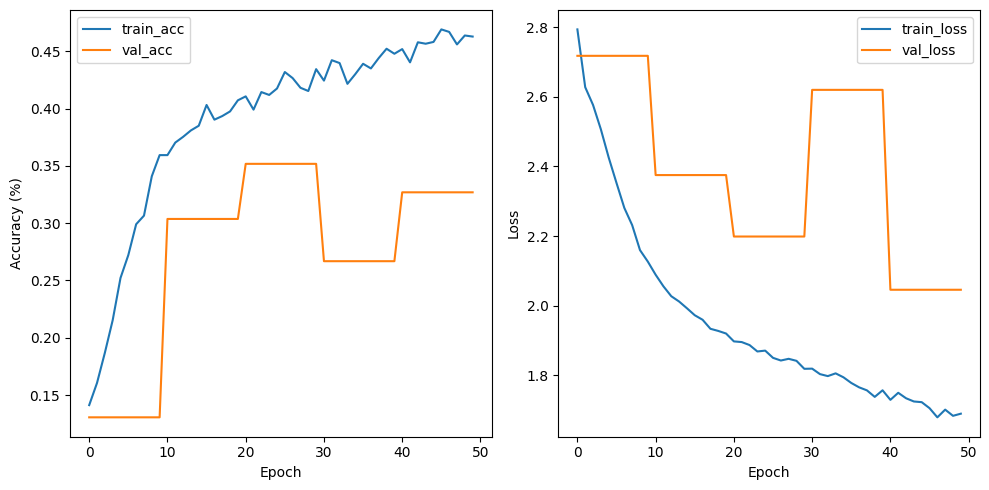

In [90]:
# Convert results to a dataframe
df = pd.DataFrame(res)
df["val_loss"] = df["val_loss"].fillna(method="ffill")
df["val_acc"] = df["val_acc"].fillna(method="ffill")

# Create the plot
fig, ax = plt.subplots(1, 2, sharex=True, sharey=False, figsize=(10, 5))
df.plot(x="epoch", y=["train_acc", "val_acc"], ax=ax[0])
df.plot(x="epoch", y=["train_loss", "val_loss"], ax=ax[1])

# Set some aesthetics
ax[0].set(xlabel="Epoch", ylabel="Accuracy (%)")
ax[1].set(xlabel="Epoch", ylabel="Loss")
fig.tight_layout()
plt.show()

### Understanding Domain Shift within GTZAN 🗺

Great! Our model appears to be doing well on the musical genres **that it was trained on.** Let's now consider the domain shift that occurs when we evaluate it on a musical genre that it **didn't see during training**.


First, we'll need to create our dataloader, as before. This time, we'll **only use recordings** from the held-out genre.

In [91]:
test_loader = torch.utils.data.DataLoader(
    AudioLoader(
        tracks=test_X,
        tempos=test_y,
        genres=test_z
    ),
    batch_size=batch_size,
    shuffle=False
)

Extracting features...: 100%|██████████| 100/100 [00:01<00:00, 56.15it/s]


Now, we can compute the accuracy of tempo predictions for our held-out genre:

In [92]:
model.eval()

target_domain_accs = []
for spect, labs in test_loader:
    spect, labs = spect.to(device), labs.to(device).long()
    with torch.no_grad():
        logs = model(spect)
    acc = accuracy_score(labs.cpu(), logs.cpu().argmax(dim=1))
    target_domain_accs.append(acc)

target_domain_acc = np.mean(target_domain_accs)
print(f"Accuracy on held-out genre '{left_out_genre}': {target_domain_acc * 100:.2f}%")

Accuracy on held-out genre 'classical': 12.98%


#### Quantifying Domain Shift 🔢

Next we can quantify the **domain shift effect** by subtracting the accuracy from held-out predictions of recordings **within the source domain** from the accuracy of predictions of recordings **within the target domain**:

In [93]:
source_domain_acc = df.iloc[-1]["val_acc"]
domain_shift_effect = source_domain_acc - target_domain_acc
print(f"Domain shift effect for held-out genre '{left_out_genre}': {domain_shift_effect * 100:.2f}%")

Domain shift effect for held-out genre 'classical': 19.71%


Wow! Our model lost **20%** of its accuracy when trying to predict a musical genre it has never seen before. This is a clear example of **domain shift** in action. In order to train a model that **generalises well** to unseen genres, we need to ensure that it has a **diverse range** of examples to learn from.

> **Try it out:** scroll right back up to the top of this notebook and change the value of `left_out_genre`. Then, repeat the training again. Does the domain shift effect change? Why might this happen?

## Understanding Western Bias through Domain Shift 🌎

One important characteristic of the **GTZAN** dataset is that all of the genres it contains are **Western**. This means that a model trained on this dataset may develop a form of **cultural bias**: it learns what "tempo" means only within a *narrow, Western context*.

Other, non-Western forms of music may contain a different range of tempo values, or may express musical tempo in different ways - for instance, by having different instruments mark the beat. Have a listen to the musical examples below to see what we mean.

In [94]:
ipd.HTML('''
<iframe width="560" height="315"
src="https://www.youtube.com/embed/ed4SIvGjqNI"
referrerpolicy="strict-origin-when-cross-origin"
</iframe>
''')

In [95]:
ipd.HTML('''
<iframe width="560" height="315"
src="https://www.youtube.com/embed/uOkRdcTxZko"
referrerpolicy="strict-origin-when-cross-origin"
</iframe>
''')

### Introducing Candombe 🪘🇺

In order to evaluate the degree of Western bias exhibited by our tempo estimation model, we're going to consider a genre of music called **Candombe**.

Candombe is one of the most characteristic features of **Uruguayan popular culture**. It is practiced by thousands of people and its rhythm influenced and was incorporated into **various genres of popular music**. Although originated in Uruguay, Candombe has its roots in the culture brought by the **African slaves in the 18th century.** It evolved during a long historical process, gradually integrating European immigrants and now **permeating the whole society.**

The instrument of Candombe is called *tambor* (*'drum'* in Spanish), of which there are three different sizes: *chico* (small), *repique* (medium) and *piano* (big). Each type has a distinctive sound (from high to low frequency range) and its own specific rhythmic pattern. All three are played with one hand hitting the skin bare and the other with a stick, which is also used to hit the shell.

<img src="https://www.eumus.edu.uy/candombe/datasets/ISMIR2015/images/cuerda_02c.jpg" width="600px"/>


#### Downloading the Candombe Dataset 🪘

We're now going to use a dataset of Candombe music available [on this website](https://www.eumus.edu.uy/candombe/datasets/ISMIR2015/candombe.html). Let's download the data first and unzip it:

In [96]:
!rm -rf ISMIR2015
!wget https://www.eumus.edu.uy/candombe/datasets/candombe_dataset.tar.gz
!tar -xf candombe_dataset.tar.gz

--2025-11-21 14:48:47--  https://www.eumus.edu.uy/candombe/datasets/candombe_dataset.tar.gz
Resolving www.eumus.edu.uy (www.eumus.edu.uy)... 164.73.13.203
Connecting to www.eumus.edu.uy (www.eumus.edu.uy)|164.73.13.203|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 658774630 (628M) [application/x-gzip]
Saving to: ‘candombe_dataset.tar.gz.2’

candombe_dataset.ta 100%[===================>] 628.26M  9.31MB/s    in 89s     

2025-11-21 14:50:17 (7.07 MB/s) - ‘candombe_dataset.tar.gz.2’ saved [658774630/658774630]



Now, let's combine the annotations and audio files together, as we did earlier:

In [97]:
candombe_root = Path("ISMIR2015")

all_candombes = []
for audio_file in candombe_root.rglob("**/*.flac"):
    # Metadata files just have a different extension
    metadata_file = audio_file.with_suffix(".csv")
    all_candombes.append((audio_file, metadata_file))

print(f"Loaded {len(all_candombes)} candombe audio files + annotations!")

Loaded 35 candombe audio files + annotations!


Let's take a listen to one of the audio files:

In [98]:
y, sr = librosa.load(all_candombes[0][0], mono=True)
ipd.Audio(y, rate=sr)

Notice how the audio file is **much longer than the audio in GTZAN**. To compensate, we'll **only use 30 seconds of audio** when evaluating our Candombe recordings.

#### Extracting Tempo from Beats 📉

The Candombe music in our dataset only contain **beat annotations**, not the overall tempo. However, we can estimate the overall tempo by computing the **difference** between successive beats, taking the median difference, and then dividing this by 60:

$$
\text{Tempo (BPM)} = \frac{60}{\;\text{median}\left( b_{i+1} - b_i \right)}
$$

where $b_i$ is the timestamp for the beat $b$ at $i$.

In [99]:
def compute_tempo_from_beats(annotation_file: Path) -> float:
    # Open the CSV file up with pandas and don't set column names
    annotation_df = pd.read_csv(annotation_file, header=None)

    # Only use the first 30 seconds
    annotation_df = annotation_df[(annotation_df[0] <= 30)]

    # Get just the beat timestamps
    beat_timestamps = annotation_df[0]

    # Compute the difference between successive beats
    beat_diff = np.diff(beat_timestamps)

    # Compute the median difference
    median_diff = np.median(beat_diff)

    # Divide 60 by the result to convert to BPM
    return float(60 / median_diff)

In [100]:
all_candombes_with_tempo = []

for (audio_fpath, annotations_fpath) in all_candombes:
    tempo = compute_tempo_from_beats(annotations_fpath)
    all_candombes_with_tempo.append((audio_fpath, tempo))

print(f"Loaded {len(all_candombes_with_tempo)} candombe audio files + tempo")

Loaded 35 candombe audio files + tempo


### Mitigating Domain Shift with Fine-Tuning 🧰

One way in which we can mitigate domain shift is via **fine-tuning**. This involves taking a model that was trained on one dataset and **continuing its training on a smaller, more relevant dataset.** By exposing the model to examples that better match the data it will see in practice, we allow it to adjust its learned features and reduce the mismatch between domains.

Imagine you've just switched to a new smartphone. You don't relearn how to use technology from the beginning: you already understand apps, menus, and gestures. But you spend a little time getting used to the new layout and features, and soon everything feels natural. Fine-tuning works the same way: the model keeps its general skills but practices on a smaller, more relevant dataset so it can perform well in a new setting.

> **Good to Know**: fine-tuning is particularly powerful because good results can be achieved from **small datasets**. In fact, fine-tuning large models on small, specific datasets is very common when working with large language models like **GPT**, as it allows for good performance at a much smaller cost versus training from scratch.

<img src="https://miro.medium.com/1*y9mXfWfxvqHk55TNrP2CXg.png" width="600px"/>



#### Preparing for Fine-Tuning 🖥

We don't need to modify our training loop all that much in order to get set up for fine-tuning. All we need to do is **split our Candombe dataset** into separate training and evaluation sets.

> **Important**: when fine-tuning on a smaller dataset, it is much more common to use a **more balanced** train-test split than when training from scratch. For now, we'll assign 50% of our Candombe recordings to a training dataset, and the other 50% to an evaluation dataset.



In [101]:
cand_X = [x for x, _ in all_candombes_with_tempo]
cand_y = [y for _, y in all_candombes_with_tempo]

In [102]:
cand_train_X, cand_test_X, cand_train_y, cand_test_y = train_test_split(
    cand_X, cand_y, test_size=0.5, random_state=42, shuffle=True
)

Now, we can create our **dataloaders**:

In [103]:
candombe_train_loader = torch.utils.data.DataLoader(
    AudioLoader(
        tracks=cand_train_X,
        tempos=cand_train_y,
        genres=["Candombe"] * len(cand_train_y),
        offset=0
    ),
    batch_size=batch_size,
    shuffle=True
)
candombe_test_loader = torch.utils.data.DataLoader(
    AudioLoader(
        tracks=cand_test_X,
        tempos=cand_test_y,
        genres=["Candombe"] * len(cand_train_y),
        offset=0
    ),
    batch_size=batch_size,
    shuffle=False
)

Extracting features...:  94%|█████████▍| 17/18 [00:02<00:00,  8.26it/s]


Let's also compute the baseline accuracy for our `candombe_test_loader` dataset, using our non-finetuned model:

In [104]:
candombe_eval_accs = []

model.eval()

for spect, labs in candombe_test_loader:
    spect, labs = spect.to(device), labs.to(device).long()
    with torch.no_grad():
        logs = model(spect)
    acc = accuracy_score(labs.cpu(), logs.cpu().argmax(dim=1))
    candombe_eval_accs.append(acc)

baseline_candombe_acc = np.mean(candombe_eval_accs)
print(baseline_candombe_acc)

0.3020833333333333


#### Start Fine-Tuning! 💪

When we fine-tune, we typically train for **fewer epochs** and with a **smaller learning rate** than when training from scratch. This allows the model to **gently update** the knowledge it has already learned while still adapting to the **new domain**

> **Did you know?** When a fine-tuned model forgets its previous training, this is called [**catastrophic forgetting** or **catastrophic interference**](https://www.ibm.com/think/topics/catastrophic-forgetting). This is more common when training for too long on the fine-tuning dataset, or with too high of a learning rate.

In [105]:
n_epochs_ft = 10
lr_ft = 1e-4

# Create a new tempo estimator
model_ft = TempoEstimatorCNN(n_tempo_classes, k=6)
model_ft.to(device)

# Copy the parameters for the previous model to the finetuned one
sd = deepcopy(model.state_dict())
model_ft.load_state_dict(sd)

# Create a new optimizer
optimizer_ft = torch.optim.Adam(model_ft.parameters(), lr=lr_ft)

# Iterate over every epoch
for epoch in range(n_epochs_ft):

    # Set model to training mode
    model_ft.train()

    # We'll store the loss and accuracy for this epoch here
    train_losses = []
    train_accs = []

    # Iterate over every batch in the training dataset
    for spects, labs in candombe_train_loader:

        # Move inputs to the GPU
        spects, labs = spects.to(device), labs.to(device).long()

        # Forward pass through the model and compute cross-entropy loss
        logs = model_ft(spects)
        loss = loss_fn(logs, labs)

        # Backwards pass back through the model
        optimizer_ft.zero_grad()
        loss.backward()
        optimizer_ft.step()

        # Compute the accuracy: tempo predicted correctly?
        acc = accuracy_score(
            labs.cpu(),
            logs.cpu().argmax(dim=1)
        )

        train_losses.append(loss.item())
        train_accs.append(acc)

    # Average loss and accuracy over all batches
    train_loss = np.mean(train_losses)
    train_acc = np.mean(train_accs)

    # Set to evaluation mode
    model_ft.eval()

    # Compute validation performance
    val_losses, val_accs = [], []

    # Iterate over every batch in the validation set
    for spects, labs in candombe_test_loader:

        # Move to the GPU if required
        spects, labs = spects.to(device), labs.to(device).long()

        # Forward pass only when validating
        with torch.no_grad():
            logs = model_ft(spects)

        # Compute loss and accuracy as before
        loss = loss_fn(logs, labs)
        val_losses.append(loss.item())
        val_accs.append(
            accuracy_score(
                labs.cpu(),
                logs.cpu().argmax(dim=1))
            )

    # Average loss and accuracy over all batches
    val_loss = np.mean(val_losses)
    val_acc = np.mean(val_accs)

    # Report the results compared to the baseline
    print(f"Epoch {epoch + 1}")
    print(f"Fine-tuned validation accuracy: {val_acc * 100:.2f}%")
    print(f"Baseline validation accuracy: {baseline_candombe_acc * 100:.2f}% \n")

Epoch 1
Fine-tuned validation accuracy: 38.54%
Baseline validation accuracy: 30.21% 

Epoch 2
Fine-tuned validation accuracy: 52.08%
Baseline validation accuracy: 30.21% 

Epoch 3
Fine-tuned validation accuracy: 42.71%
Baseline validation accuracy: 30.21% 

Epoch 4
Fine-tuned validation accuracy: 53.12%
Baseline validation accuracy: 30.21% 

Epoch 5
Fine-tuned validation accuracy: 42.71%
Baseline validation accuracy: 30.21% 

Epoch 6
Fine-tuned validation accuracy: 43.75%
Baseline validation accuracy: 30.21% 

Epoch 7
Fine-tuned validation accuracy: 44.79%
Baseline validation accuracy: 30.21% 

Epoch 8
Fine-tuned validation accuracy: 52.08%
Baseline validation accuracy: 30.21% 

Epoch 9
Fine-tuned validation accuracy: 54.17%
Baseline validation accuracy: 30.21% 

Epoch 10
Fine-tuned validation accuracy: 53.12%
Baseline validation accuracy: 30.21% 



Great: we can see how, by **fine-tuning** our model, we are able to **reduce** the Western bias of our tempo estimator model, improving performance on Candombe music. We did this by pretraining a tempo estimator on a large and diverse set of recordings, and then fine tuning using a **very small subset of recordings** from the target domain.

## Domain Adaptation with Transfer Learning 🚗

In the previous section, we saw how **fine-tuning** can help mitigate domain shift by gently updating the weights of a pre-trained model with new information. But what if we want to use our existing model to perform a **new task**? In that case, we can turn to **transfer learning**. This is a technique where we take a model that already knows something useful - like predict the tempo of a piece of music - and teach it to do a different (but *slightly related*) job.

This is a lot like **learning a new sport**: if you already know how to play football, you don't need to relearn how to run or kick when you switch to rugby - you just learn the new rules and movements on top of the skills you already have. With transfer learning, we *save time, use less data, and often end up with better performance* than if we had trained a whole new model from scratch.

### Transferring to Genre Identification 🎼

Recall how **GTZAN** contains both the **tempo** and the **genre** of an audio recording. We might imagine how learning to predict the former could be helpful for the latter: after all, some genres of music might tend to show a preference for a particular tempo. So, we can use the **features** learned by our **tempo estimator** to learn to **predict the genre** of a recording.

This will save us the effort of training a **genre classifier** from scratch, and might even perform better, too!

<img src="https://images.squarespace-cdn.com/content/v1/56b8f8efab48debb2efb2ef5/1555587249549-M8UGSQNDSFIQVC2EQUU4/Musical+genres.png" width="600px"/>

#### Modifying our `DataLoader` 🚚

Currently, our `DataLoader` returns a spectrogram and the corresponding tempo. In order to train a genre identification model, we need to **subclass** our `DataLoader` to return the **genre** of a recording, rather than its tempo.

Let's do it:

In [189]:
class AudioLoaderGenre(AudioLoader):
    """
    Child class of AudioLoader (defined above)
    """

    def __init__(
        self,
        tracks: list,
        tempos: list,
        genres: list,
        offset: float = 0.,
        hop_length: str = 128,
        n_frames: int = 256,
        target_sr: int = 11025,
    ):
        super().__init__(
            tracks=tracks,
            tempos=tempos,
            genres=genres,
            offset=offset,
            hop_length=hop_length,
            n_frames=n_frames,
            target_sr=target_sr
        )

    def extract_features(self, track_names, tempos, genres) -> tuple[list, list]:
        """
        Extract features and labels from all tracks.
        """
        all_frames, all_genres = [], []

        # Iterate over all tracks
        for track, _, genre in tqdm(
            zip(track_names, tempos, genres),
            total=len(track_names),
            desc="Extracting features..."
        ):
            # Load the track in librosa
            #  Cap the audio at 30 seconds, the duration of GTZAN recordings
            y, sr = librosa.load(track, mono=True, sr=self.target_sr, duration=30, offset=self.offset)

            # Split into frames: (batch, mel_bins, frames, 1)
            frames = self.frame_track(y)

            # Keep one label for every frame
            # Here is the modification
            for frame in frames:
                all_frames.append(frame)
                all_genres.append(genre)

        return all_frames, all_genres

    def __getitem__(self, idx: int) -> tuple[np.ndarray, float]:
        # We also modify the __getitem__ to return the genre
        return self.all_frames[idx], self.all_labels[idx]

Next, we need to compute a **mapping** that will allow us to translate a `string` representation of a genre (e.g., "hiphop") to an integer that we can use when training:

In [190]:
unique_genres = np.unique(train_z + val_z)
genre_to_idx = {str(genre): idx for idx, genre in enumerate(unique_genres)}
idx_to_genre = {idx: str(genre) for idx, genre in enumerate(unique_genres)}

print("Mapping: ", genre_to_idx)

Mapping:  {'blues': 0, 'country': 1, 'disco': 2, 'hiphop': 3, 'jazz': 4, 'metal': 5, 'pop': 6, 'reggae': 7, 'rock': 8}


Now, we can create our dataloaders, using the **same splits** as when we trained our model initially.

In [191]:
train_loader_genre = torch.utils.data.DataLoader(
    AudioLoaderGenre(
        tracks=train_X,
        tempos=train_y,
        genres=[genre_to_idx[g] for g in train_z]
    ),
    batch_size=batch_size,
    shuffle=True
)
val_loader_genre = torch.utils.data.DataLoader(
    AudioLoaderGenre(
        tracks=val_X,
        tempos=val_y,
        genres=[genre_to_idx[g] for g in val_z]
    ),
    batch_size=batch_size,
    shuffle=False
)

Extracting features...: 100%|██████████| 99/99 [00:01<00:00, 55.15it/s]


We can iterate through our dataloaders and map the returned integers back onto their genres:

In [192]:
for spect, genres in train_loader_genre:
    genres_mapped = [(g.item(), idx_to_genre[g.item()]) for g in genres]
    print(genres_mapped)
    break

[(0, 'blues'), (4, 'jazz'), (7, 'reggae'), (0, 'blues'), (0, 'blues'), (6, 'pop'), (8, 'rock'), (1, 'country'), (5, 'metal'), (5, 'metal'), (8, 'rock'), (4, 'jazz'), (5, 'metal'), (4, 'jazz'), (6, 'pop'), (2, 'disco'), (7, 'reggae'), (2, 'disco'), (5, 'metal'), (7, 'reggae'), (6, 'pop'), (7, 'reggae'), (2, 'disco'), (0, 'blues'), (3, 'hiphop'), (1, 'country'), (8, 'rock'), (7, 'reggae'), (6, 'pop'), (4, 'jazz'), (5, 'metal'), (3, 'hiphop')]


#### Extracting Features 🥶

The general idea here is that we want to **extract the features** from the convolutional blocks of our model - everything up until the fully-connected layer - and use these as the input to a different classification model. **We are not fine-tuning the `TempoEstimatorCNN`**: instead, we are just using the features it has **already learned to extract** to train a different model.

> **Good to know**: sometimes, we may refer to a pre-trained model that is used only to extract features as a **frozen** model

Luckily, we defined a method inside our `TempoEstimatorCNN` called `forward_features`. This takes a **spectrogram input** from our dataloader and returns a **feature vector**. Let's use this method to extract the features from our dataloaders.

In [193]:
train_feat, train_labs = [], []

# Need to freeze the feature weights
model.eval()

# Extract features from the training set
for spect, labs in train_loader_genre:
    spect, labs = spect.to(device), labs.to(device).long()
    # Forward pass, no gradient accumulation
    with torch.no_grad():
        feats = model.forward_features(spect)
    train_feat.append(feats.cpu().numpy())
    train_labs.append(labs.cpu().numpy())

train_feat = np.concatenate(train_feat)
train_labs = np.concatenate(train_labs)

# Extract features from the evaluation set
val_feat, val_labs = [], []

for spect, labs in val_loader_genre:
    spect, labs = spect.to(device), labs.to(device).long()
    with torch.no_grad():
        feats = model.forward_features(spect)
    val_feat.append(feats.cpu().numpy())
    val_labs.append(labs.cpu().numpy())

val_feat = np.concatenate(val_feat)
val_labs = np.concatenate(val_labs)

print("Training features: ", train_feat.shape, "Training labels: ", train_labs.shape)
print("Validation features: ", val_feat.shape, "Validation labels: ", val_labs.shape)

Training features:  (3200, 64) Training labels:  (3200,)
Validation features:  (396, 64) Validation labels:  (396,)


> **Good to know**: in the previous notebooks, we extracted features manually, such as **spectral centroid** and **zero-crossing rate**. This meant that we could interpret them easily. In contrast, when we use a neural network to *learn features from an input*, it is usually harder to interpret these features. As a result, we may sometimes see these features referred to as **hidden**.

### Training a Genre Classifier 🤖

Now that we have our features, we can use them as the input to a classifier. We could use any model architecture here - even another neural network! - but, for now, we'll just use a `KNearestNeighbours` classifier from `sklearn`.

> **Important**: if this is the first time you're encountering a `KNearestNeighbours` classifier, check out the notebook on **Learning Paradigms** where this is introduced.

In [194]:
genre_classifier = KNeighborsClassifier(n_neighbors=5)

Now, let's fit the model to our training features, and predict the test set:

In [195]:
# Fit the model
genre_classifier.fit(train_feat, train_labs)

# Predict the held out data
val_pred = genre_classifier.predict(val_feat)

# Compute the accuracy
val_acc_genre = accuracy_score(val_labs, val_pred)
print(f"Validation accuracy: {(val_acc_genre * 100):.2f}%")

Validation accuracy: 48.23%


Great! We can see that the features extracted by our tempo classifier **transfer** to the task of genre identification, too.

### Comparing to a Baseline Model 📢

In order to evaluate how well our new genre classifier is, let's compare it to a baseline model.

#### Extracting Spectral Features 📶

We'll just use some simple acoustic features extracted from every spectrogram:

1. **Spectral centroid**: the average frequency of every **column** in the spectrogram
2. **Spectral bandwidth**: the standard deviation of every **column** in the spectrogram
3. **Spectral flatness**: measures how "noisy" a sound is.
4. **Spectral rolloff**: the frequency below which most of the signal’s energy is concentrated (usually 85%).

> **Tip:** for a refresher on what these features mean, check out the notebooks on **Data Representations** and **Learning Paradigms**

Let's now extract these features from the spectrograms we've already created for each recording:

In [196]:
def extract_spectral_features(spectrogram: np.ndarray) -> np.ndarray:
    """
    Extracts spectral features from an input spectrogram

    Input shape: (40, 256) == (bands, frames)
    Output shape: (4,) == (features,)
    """

    # Compute all of the features and average across frames
    scentroid = librosa.feature.spectral_centroid(S=spectrogram)
    sband = librosa.feature.spectral_bandwidth(S=spectrogram)
    sflat = librosa.feature.spectral_flatness(S=spectrogram)
    sroll = librosa.feature.spectral_rolloff(S=spectrogram)

    # Before we average, the shape should be 256 (one value per frame)
    assert scentroid.flatten().shape[0] == 256

    # Stack the features and average each column
    return np.vstack([scentroid, sband, sflat, sroll]).mean(axis=1)

In [197]:
# Pre-populate the feature array
train_feats_baseline = np.zeros((train_feat.shape[0], 4))

counter = 0
# Iterate over all batches
for spect_batch, labs in train_loader_genre:

    # Iterate over each spectrogram in the batch
    for spect in spect_batch:

        # Need to convert the torch tensor to numpy and run on CPU
        spect = spect.cpu().numpy()[:, :, 0]

        # Extract the features
        s_feat = extract_spectral_features(spect)

        # Update the array with the features
        train_feats_baseline[counter, :] = s_feat

        # Increment the counter
        counter += 1

# Do the same for the validation data
val_feats_baseline = np.zeros((val_feat.shape[0], 4))
counter = 0
for spect_batch, labs in val_loader_genre:
    for spect in spect_batch:
        spect = spect.cpu().numpy()[:, :, 0]
        s_feat = extract_spectral_features(spect)
        val_feats_baseline[counter, :] = s_feat
        counter += 1

Let's not forget to normalise the features, as well. We'll use **min-max scaling**, as that worked well in the previous notebook.

> **Tip:** for a refresher on why we need to **normalise** our features (as well as ways in which we may do this), check out the notebook on **Learning Representations**

In [198]:
def minmax_norm(feature: np.ndarray) -> np.ndarray:
    """
    Normalises a feature to have min(F) = 0, max(F) = 1
    """
    min_ = feature.min()
    max_ = feature.max()
    return (feature - min_) / (max_ - min_)


train_feats_baseline_norm = np.apply_along_axis(minmax_norm, 0, train_feats_baseline)
val_feats_baseline_norm = np.apply_along_axis(minmax_norm, 0, val_feats_baseline)

#### Fitting the Baseline 💪

Now, we're ready to fit the baseline model.

In [199]:
genre_classifier_baseline = KNeighborsClassifier(n_neighbors=5)

In [200]:
# Fit the model
genre_classifier.fit(train_feats_baseline_norm, train_labs)

# Predict the held out data
val_pred = genre_classifier.predict(val_feats_baseline_norm)

# Compute the accuracy
val_acc_genre_baseline = accuracy_score(val_labs, val_pred)
print(f"Validation accuracy: {(val_acc_genre_baseline * 100):.2f}%")

Validation accuracy: 10.86%


And finally, let's compare to the baseline:

In [201]:
print(f"Transfer learning model accuracy: {(val_acc_genre * 100):.2f}%")
print(f"Baseline model accuracy: {(val_acc_genre_baseline * 100):.2f}%")

Transfer learning model accuracy: 48.23%
Baseline model accuracy: 10.86%


Wow - our transfer learning model **significantly outperforms the baseline**. This shows the power of transfer learning: features that can perform one task well **may be useful for another task**, too!

## Summary 🤖🎹

In this notebook, we explored the related concepts of **domain shift** and **domain adaptation**.

**Domain shift** happens when a model is trained on one kind of data but is later tested or used on data that **looks different**. Even small changes can confuse a model that wasn't prepared for them. As a result, a model that once seemed accurate **might suddenly struggle.** What's more, domain shift can also cause a model to demonstrate unfair **bias** against cultures or traditions that aren't contained in the training data.

Likewise, **domain adaptation** is the process we use to **adapt** a model trained on one domain to another. There are a variety of techniques that can be useful here, including **fine-tuning** and **transfer learning**.

In order to explore **domain shift**, we used the concept of **musical tempo estimation** - trying to work out automatically how fast or slow a piece of music is. We trained a convolutional neural network to predict the tempo of different pieces of music, and then evaluated the same model on two genres it has never seen before.

To reduce the effect of domain shift, we then explored **fine-tuning**. This allows us to use a **small dataset** from a new domain and optimize the parameters of an existing model to this domain. By using fine-tuning, we were able to improve our model's performance on **Candombe**, a genre of non-Western music from Uruguay.

Finally, we explored the concept of **transfer learning**, where a pre-trained model is adapted to a **completely new task**. We showed how features learned by a model trained to estimate the tempo of a musical piece can also apply when learning to **identify its genre**, too. Finally, we saw how transfer learning can lead to **better performance** than simply training a new model from scratch.